# Imports

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os

import scanpy as sc
from collections import defaultdict

import matplotlib
from matplotlib.pyplot import rcParams
import matplotlib.pyplot as plt

/home/icb/amirali.moinfar/miniconda3/envs/drvi_repr/lib/python3.10/site-packages/anndata/utils.py:429: FutureWarning: Importing read_csv from `anndata` is deprecated. Import anndata.io.read_csv instead.
  warnings.warn(msg, FutureWarning)
/home/icb/amirali.moinfar/miniconda3/envs/drvi_repr/lib/python3.10/site-packages/anndata/utils.py:429: FutureWarning: Importing read_text from `anndata` is deprecated. Import anndata.io.read_text instead.
  warnings.warn(msg, FutureWarning)
/home/icb/amirali.moinfar/miniconda3/envs/drvi_repr/lib/python3.10/site-packages/anndata/utils.py:429: FutureWarning: Importing read_excel from `anndata` is deprecated. Import anndata.io.read_excel instead.
  warnings.warn(msg, FutureWarning)
/home/icb/amirali.moinfar/miniconda3/envs/drvi_repr/lib/python3.10/site-packages/anndata/utils.py:429: FutureWarning: Importing read_mtx from `anndata` is deprecated. Import anndata.io.read_mtx instead.
  warnings.warn(msg, FutureWarning)
/home/icb/amirali.moinfar/miniconda3/e

In [3]:
import warnings
# warnings.filterwarnings(action='once')
warnings.filterwarnings('ignore')

In [4]:
import os

import scanpy as sc
import numpy as np
from pathlib import Path
from sklearn.feature_selection import mutual_info_classif
from scipy import stats

from drvi_notebooks.utils.data.data_configs import get_data_info
from drvi_notebooks.utils.run_info import get_run_info_for_dataset
from drvi_notebooks.utils.method_info import pretify_method_name
from drvi_notebooks.utils.plotting import plot_per_latent_scatter, scatter_plot_per_latent

In [5]:
sc.set_figure_params(vector_friendly=True, dpi_save=300)

In [6]:
import mplscience
mplscience.available_styles()
mplscience.set_style()

['default', 'despine']


# Config

In [7]:
cwd = os.getcwd()

In [8]:
logs_dir = Path(os.path.expanduser('~/workspace/train_logs'))
logs_dir

PosixPath('/home/icb/amirali.moinfar/workspace/train_logs')

In [9]:
proj_dir = Path(cwd).parent.parent
proj_dir

PosixPath('/ictstr01/home/icb/amirali.moinfar/projects/drvi_reproducibility_public')

In [10]:
output_dir = proj_dir / 'plots' / 'crispr_screen_norman'
output_dir.mkdir(parents=True, exist_ok=True)
output_dir

PosixPath('/ictstr01/home/icb/amirali.moinfar/projects/drvi_reproducibility_public/plots/crispr_screen_norman')

In [11]:
run_name = 'norman_hvg'
run_version = '4.3'
run_path = os.path.expanduser('~/workspace/train_logs/models')

data_info = get_data_info(run_name, run_version)
wandb_address = data_info['wandb_address']
col_mapping = data_info['col_mapping']
plot_columns = data_info['plot_columns']
pp_function = data_info['pp_function']
data_path = data_info['data_path']
var_gene_groups = data_info['var_gene_groups']
cell_type_key = data_info['cell_type_key']
exp_plot_pp = data_info['exp_plot_pp']
control_treatment_key = data_info['control_treatment_key']
condition_key = data_info['condition_key']
split_key = data_info['split_key']

In [12]:
cat_10_pallete = sc.plotting.palettes.vega_10_scanpy
cat_10_pallete_without_grey = [c for c in cat_10_pallete if c != '#7f7f7f']
cat_20_pallete = sc.plotting.palettes.vega_20_scanpy
wong_pallete = [
    "#E69F00", "#56B4E9", "#009E73", "#F0E442", "#0072B2", "#D55E00", "#CC79A7", "#000000",
]
cat_100_pallete = sc.plotting.palettes.godsnot_102

## Utils

In [13]:
def set_font_in_rc_params():
    fs = 16
    plt.rcParams.update({
        'font.size': fs,            # General font size
        'axes.titlesize': fs,      # Title font size
        'axes.labelsize': fs,      # Axis label font size
        'legend.fontsize': fs,    # Legend font size
        'xtick.labelsize': fs,      # X-axis tick label font size
        'ytick.labelsize': fs       # Y-axis tick label font size
    })

## Data

In [14]:
adata = sc.read(data_path)
adata

AnnData object with n_obs × n_vars = 104339 × 5000
    obs: 'guide_identity', 'read_count', 'UMI_count', 'coverage', 'gemgroup', 'good_coverage', 'number_of_cells', 'guide_AHR', 'guide_ARID1A', 'guide_ARRDC3', 'guide_ATL1', 'guide_BAK1', 'guide_BCL2L11', 'guide_BCORL1', 'guide_BPGM', 'guide_C19orf26', 'guide_C3orf72', 'guide_CBFA2T3', 'guide_CBL', 'guide_CDKN1A', 'guide_CDKN1B', 'guide_CDKN1C', 'guide_CEBPA', 'guide_CEBPB', 'guide_CEBPE', 'guide_CELF2', 'guide_CITED1', 'guide_CKS1B', 'guide_CLDN6', 'guide_CNN1', 'guide_CNNM4', 'guide_COL1A1', 'guide_COL2A1', 'guide_CSRNP1', 'guide_DLX2', 'guide_DUSP9', 'guide_EGR1', 'guide_ELMSAN1', 'guide_ETS2', 'guide_FEV', 'guide_FOSB', 'guide_FOXA1', 'guide_FOXA3', 'guide_FOXF1', 'guide_FOXL2', 'guide_FOXO4', 'guide_GLB1L2', 'guide_HES7', 'guide_HK2', 'guide_HNF4A', 'guide_HOXA13', 'guide_HOXB9', 'guide_HOXC13', 'guide_IER5L', 'guide_IGDCC3', 'guide_IKZF3', 'guide_IRF1', 'guide_ISL2', 'guide_JUN', 'guide_KIAA1804', 'guide_KIF18B', 'guide_KIF2C', 'g

## Runs to load

In [15]:
run_info = get_run_info_for_dataset('norman_hvg')
RUNS_TO_LOAD = run_info.run_dirs
scatter_point_size = run_info.scatter_point_size
adata_to_transfer_obs = run_info.adata_to_transfer_obs

for k,v in RUNS_TO_LOAD.items():
    if not os.path.exists(v):
        raise ValueError(f"{v} does not exists.")

In [16]:
embeds = {}
methods_to_consider = ["DRVI", "DRVI-IK", "scVI", "PCA", "ICA", "MICHIGAN-opt", "TCVAE-opt", "MOFA"]

random_order = None
for method_name, run_path in RUNS_TO_LOAD.items():
    if method_name not in methods_to_consider:
        continue
    print(method_name)
    if str(run_path).endswith(".h5ad"):
        embed = sc.read(run_path)
    else:
        embed = sc.read(run_path / 'latent.h5ad')
    pp_function(embed)
    if random_order is None:
        random_order = embed.obs.sample(frac=1.).index
    embed = embed[random_order].copy()
    embeds[method_name] = embed

DRVI
DRVI-IK
scVI
PCA
ICA
MOFA
TCVAE-opt
MICHIGAN-opt


# Comparison of scatterplots and MI

In [19]:
mi_scores = defaultdict(dict)

In [20]:
for method_name, embed in embeds.items():
    print(method_name)
    for pert_name in ['SET', 'KLF1', 'DUSP9', 'IRF1']:
        if pert_name not in mi_scores[method_name]:
            # is_pert_active = embed.obs['perturbation_name'].str.contains(pert_name).astype(int)
            is_pert_active = (embed.obs['perturbation_name'] == pert_name).astype(int)
            embedding_array = embed.X
            mi_score = (
                mutual_info_classif(embedding_array, is_pert_active, discrete_features=False)
                /
                stats.entropy([is_pert_active.mean(), 1 - is_pert_active.mean()])
            )
            mi_scores[method_name][pert_name] = mi_score
        print(f"{pert_name} Max MI score: ", mi_scores[method_name][pert_name].max())

DRVI
SET Max MI score:  0.5958851164861529
KLF1 Max MI score:  0.554513562551423
DUSP9 Max MI score:  0.5343515038311292
IRF1 Max MI score:  0.7574792319665092
DRVI-IK
SET Max MI score:  0.5799843909404984
KLF1 Max MI score:  0.553182202782938
DUSP9 Max MI score:  0.31915342815275766
IRF1 Max MI score:  0.704707774384504
scVI
SET Max MI score:  0.35230791203721246
KLF1 Max MI score:  0.25979542348516166
DUSP9 Max MI score:  0.20263267523434395
IRF1 Max MI score:  0.27305341954316115
PCA
SET Max MI score:  0.32782938039782206
KLF1 Max MI score:  0.26056358569252047
DUSP9 Max MI score:  0.16898977700216233
IRF1 Max MI score:  0.2688333835448772
ICA
SET Max MI score:  0.5631050817913926
KLF1 Max MI score:  0.5422766566320698
DUSP9 Max MI score:  0.46819486957926343
IRF1 Max MI score:  0.6956148189888621
MOFA
SET Max MI score:  0.27324577280337226
KLF1 Max MI score:  0.27254196184338236
DUSP9 Max MI score:  0.1759621467878692
IRF1 Max MI score:  0.42361579674981176
TCVAE-opt
SET Max MI sco

 p1_cts ['KLF1', 'KLF1+MAP2K6', 'FOXA1+KLF1', 'CEBPE+KLF1', 'COL2A1+KLF1', 'AHR+KLF1', 'BAK1+KLF1', 'DUSP9+KLF1', 'CLDN6+KLF1', 'KLF1+TGFBR2', 'CEBPA+KLF1', 'KLF1+SET'] 
 p2_cts ['SET', 'CEBPE+SET', 'IRF1+SET', 'RHOXF2+SET', 'KLF1+SET']
DRVI
plotting Dim 59, Dim 29


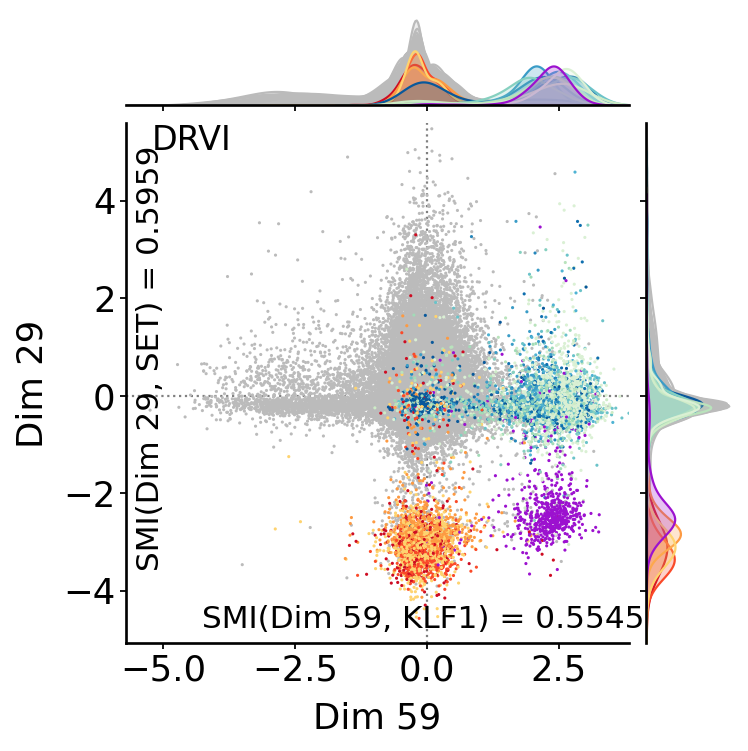

End of latent plots
DRVI-IK
plotting Dim 32, Dim 33


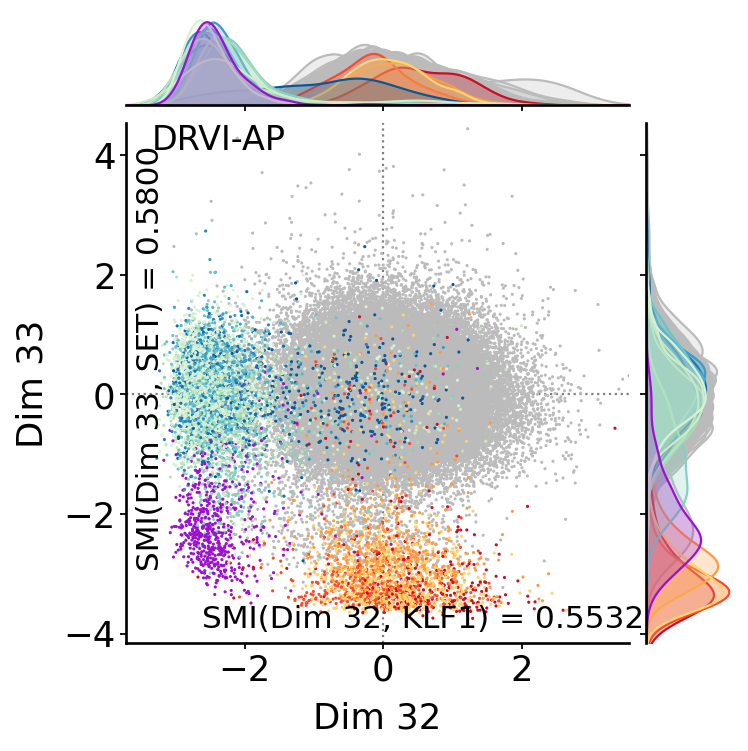

End of latent plots
scVI
plotting Dim 39, Dim 19


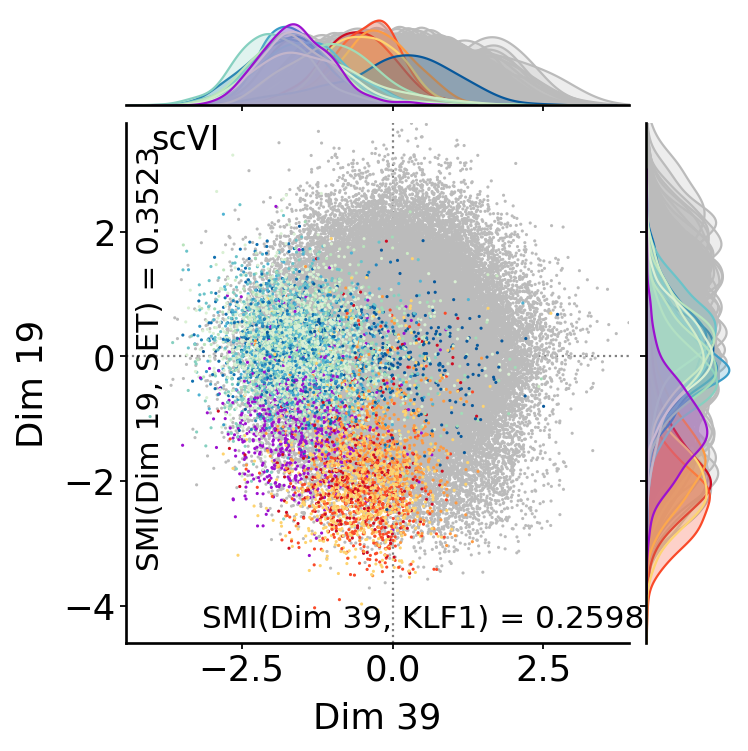

End of latent plots
PCA
plotting Dim 12, Dim 17


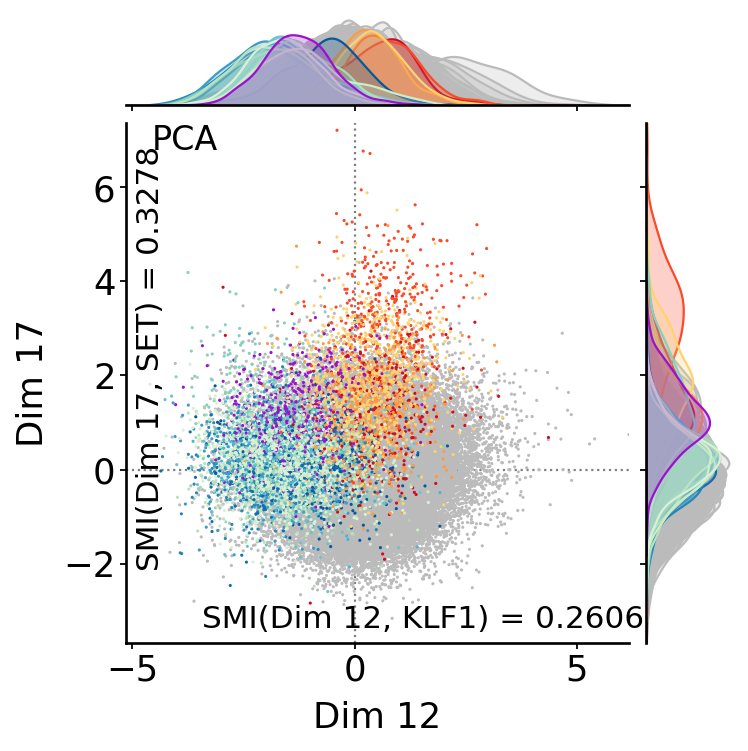

End of latent plots
ICA
plotting Dim 61, Dim 58


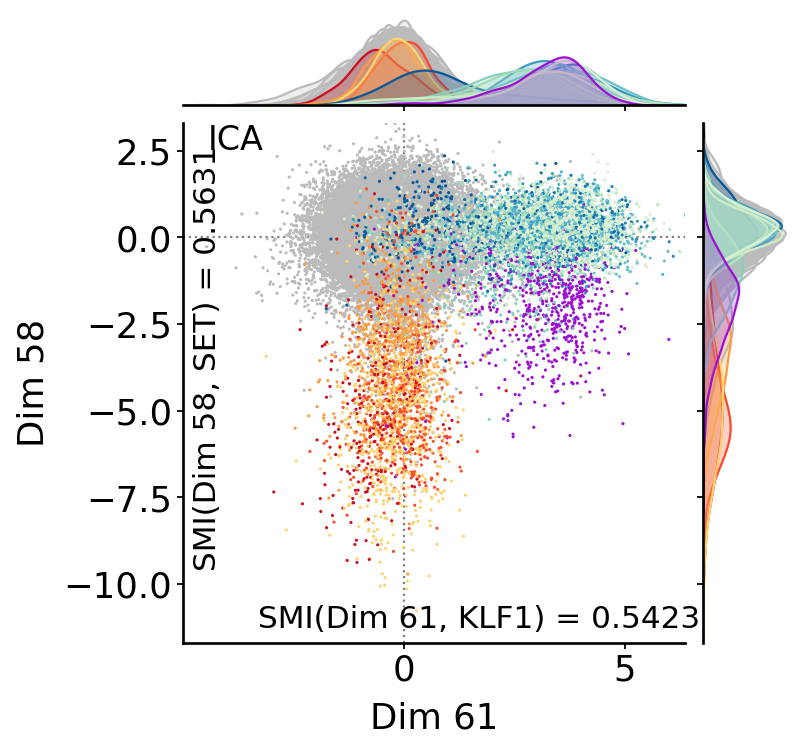

End of latent plots
MOFA
plotting Dim 13, Dim 18


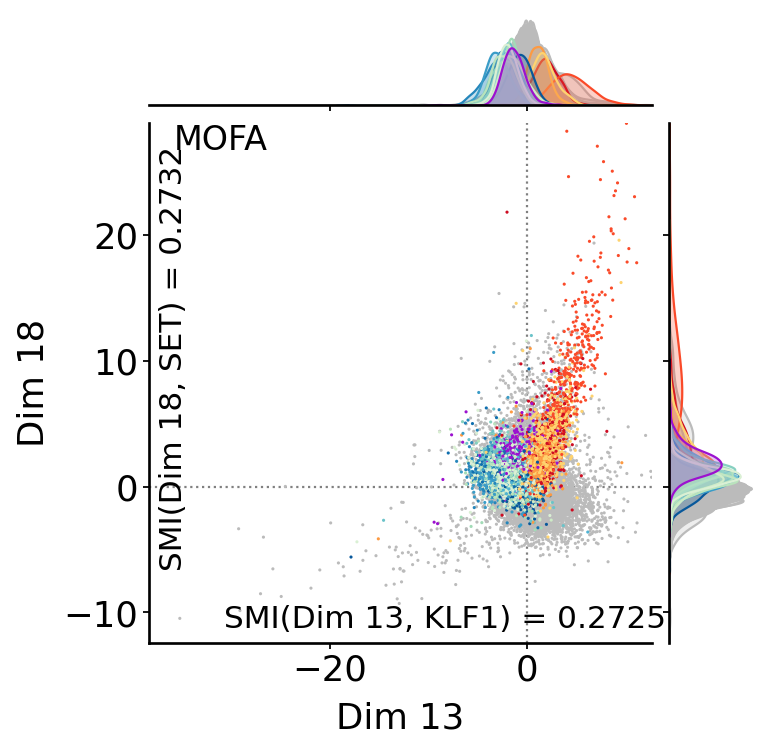

End of latent plots
TCVAE-opt
plotting Dim 31, Dim 41


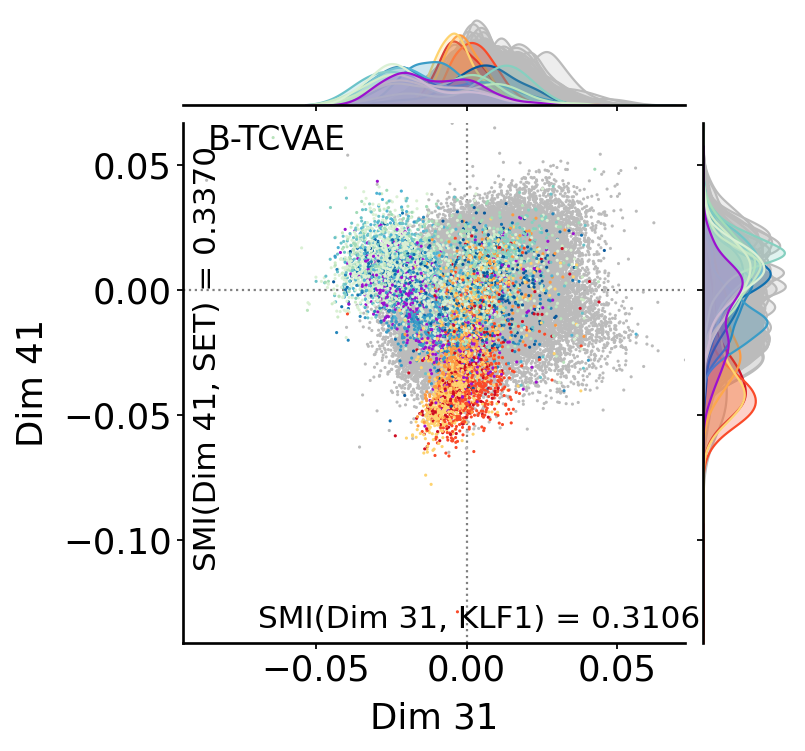

End of latent plots
MICHIGAN-opt
plotting Dim 36, Dim 4


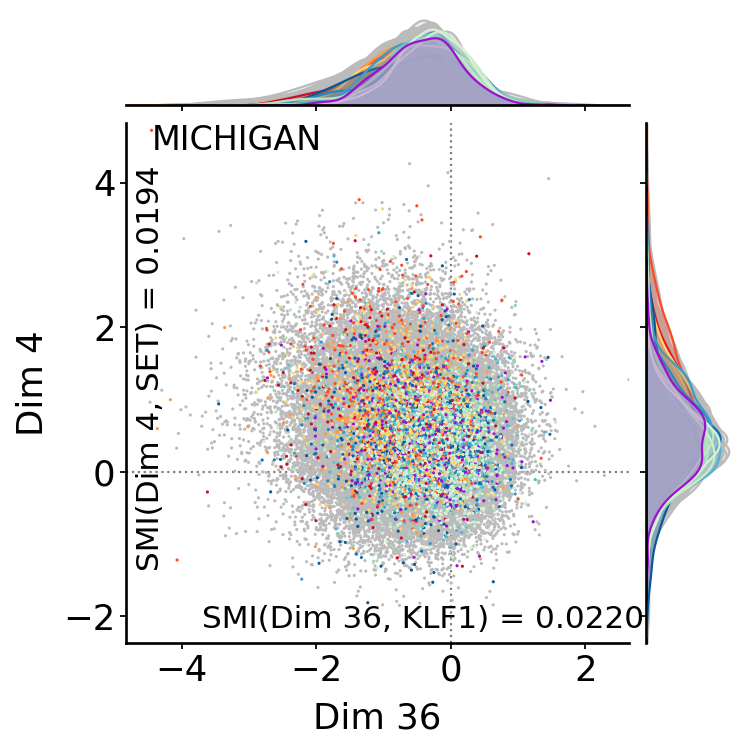

End of latent plots
plotting Dim 36, Dim 4


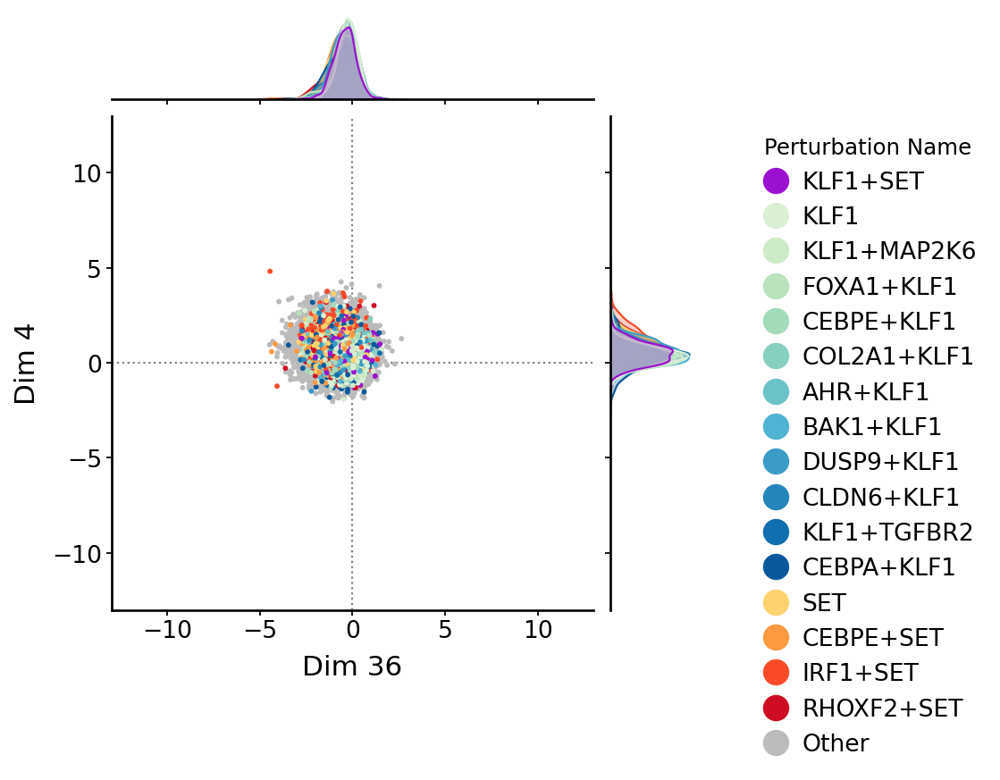

End of latent plots
 p1_cts ['DUSP9', 'DUSP9+MAPK1', 'DUSP9+ETS2', 'DUSP9+PRTG', 'DUSP9+IGDCC3', 'DUSP9+KLF1', 'DUSP9+SNAI1'] 
 p2_cts ['SET', 'CEBPE+SET', 'KLF1+SET', 'IRF1+SET', 'RHOXF2+SET']
DRVI
plotting Dim 45, Dim 29


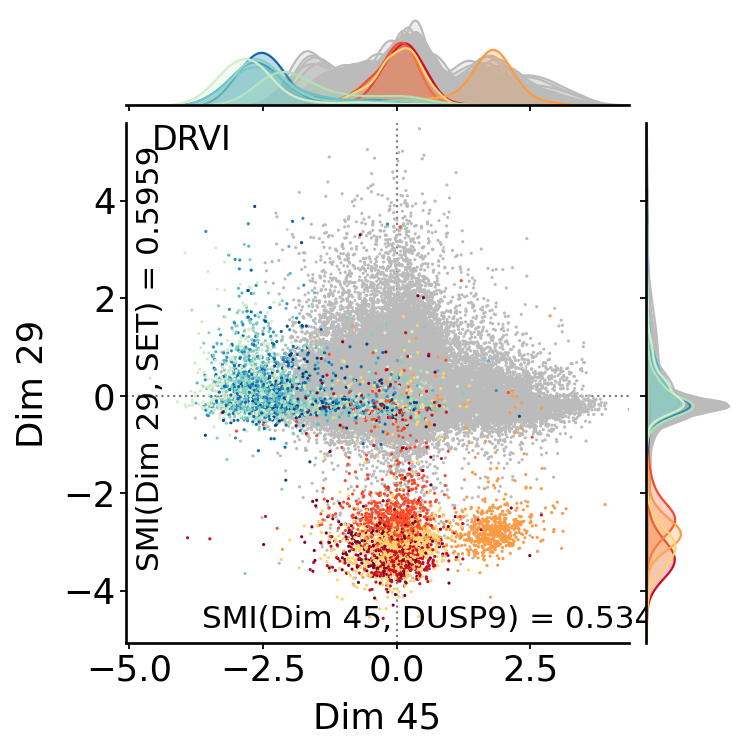

End of latent plots
DRVI-IK
plotting Dim 5, Dim 33


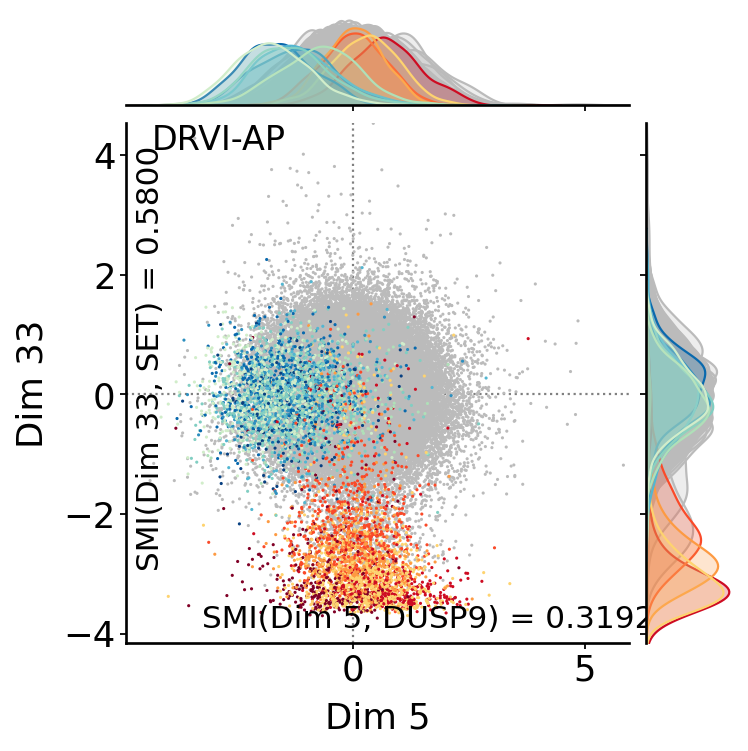

End of latent plots
scVI
plotting Dim 21, Dim 19


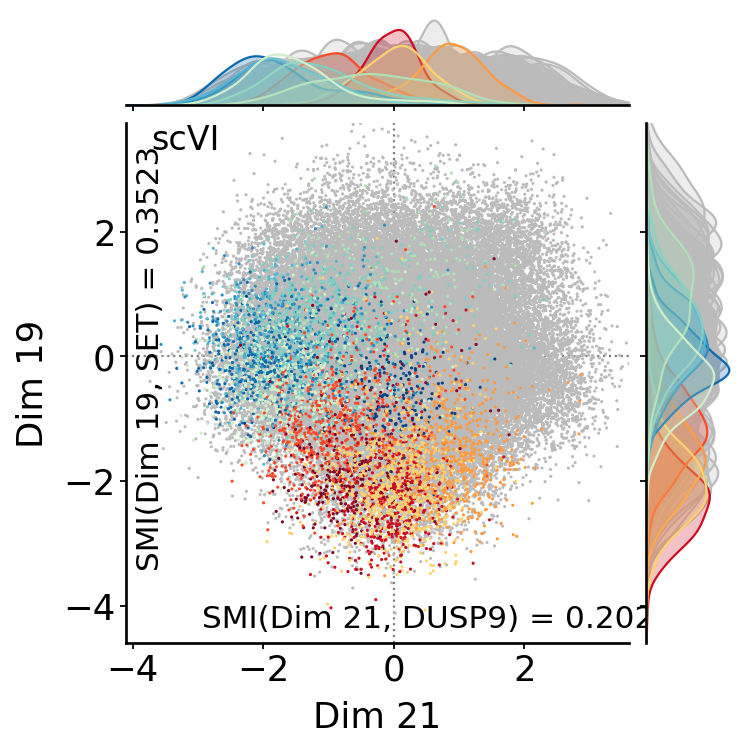

End of latent plots
PCA
plotting Dim 2, Dim 17


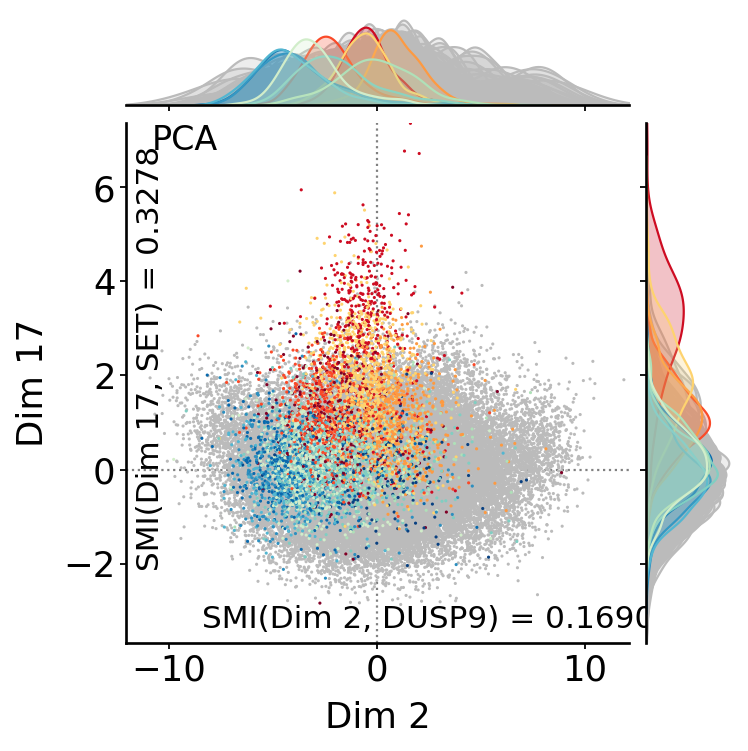

End of latent plots
ICA
plotting Dim 31, Dim 58


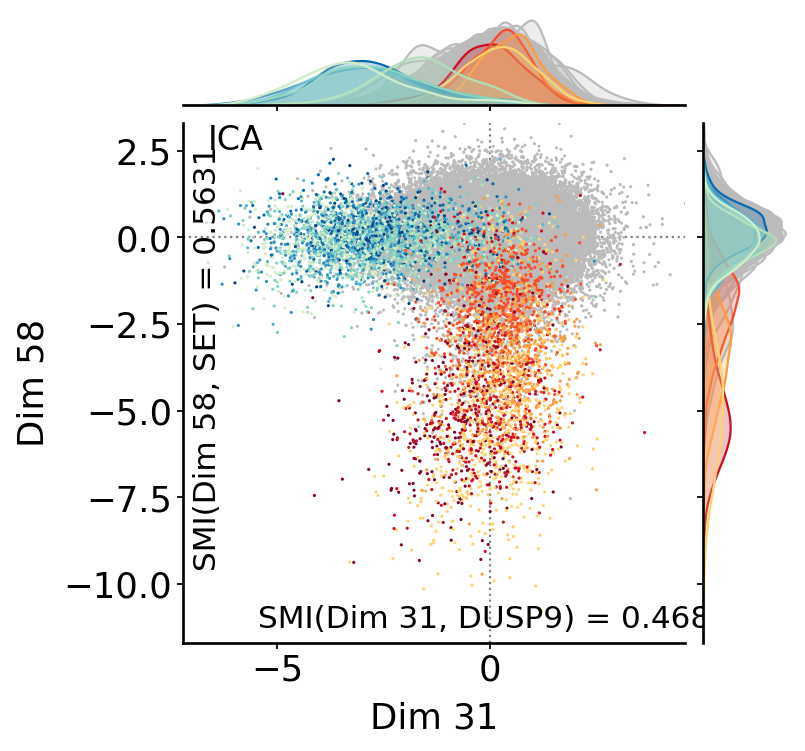

End of latent plots
MOFA
plotting Dim 2, Dim 18


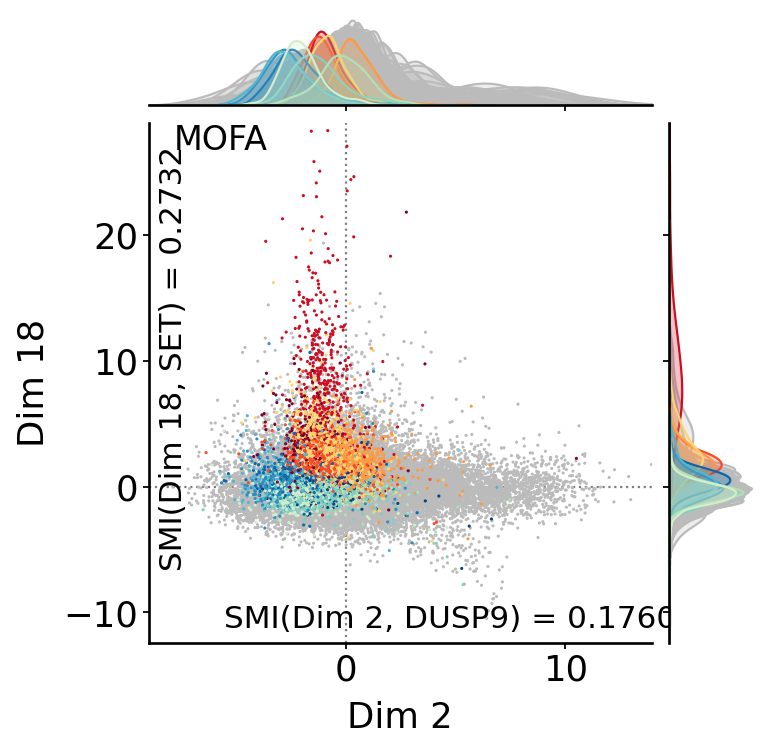

End of latent plots
TCVAE-opt
plotting Dim 46, Dim 41


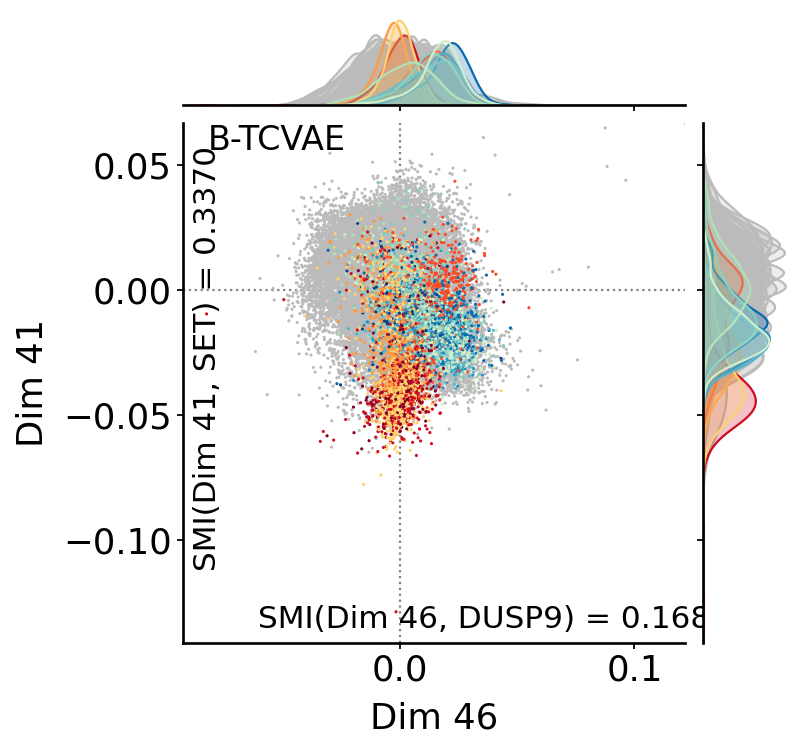

End of latent plots
MICHIGAN-opt
plotting Dim 35, Dim 4


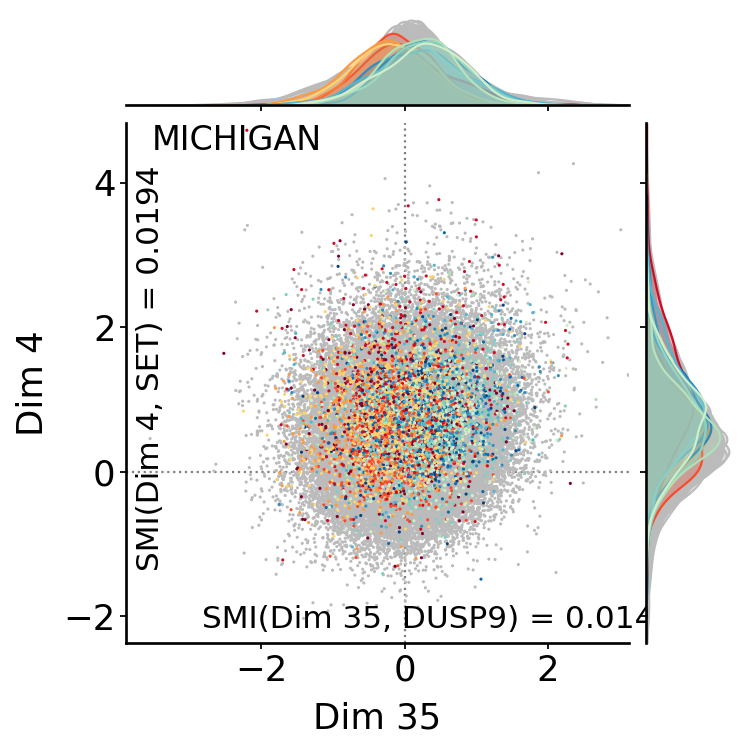

End of latent plots
plotting Dim 35, Dim 4


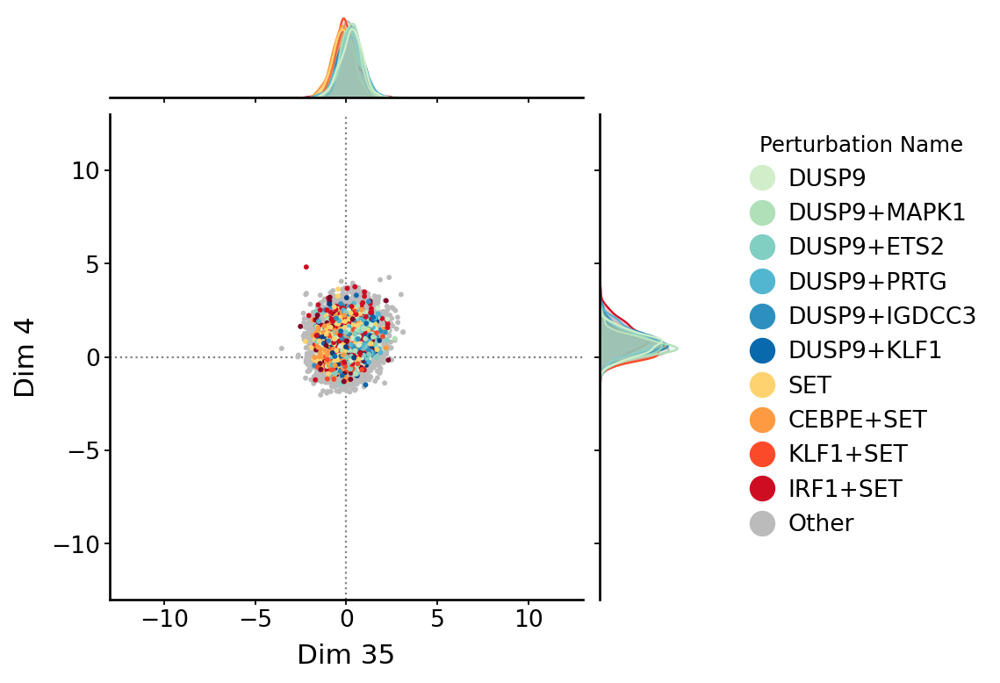

End of latent plots
 p1_cts ['IRF1', 'IRF1+SET'] 
 p2_cts ['SET', 'CEBPE+SET', 'KLF1+SET', 'RHOXF2+SET', 'IRF1+SET']
DRVI
plotting Dim 23, Dim 29


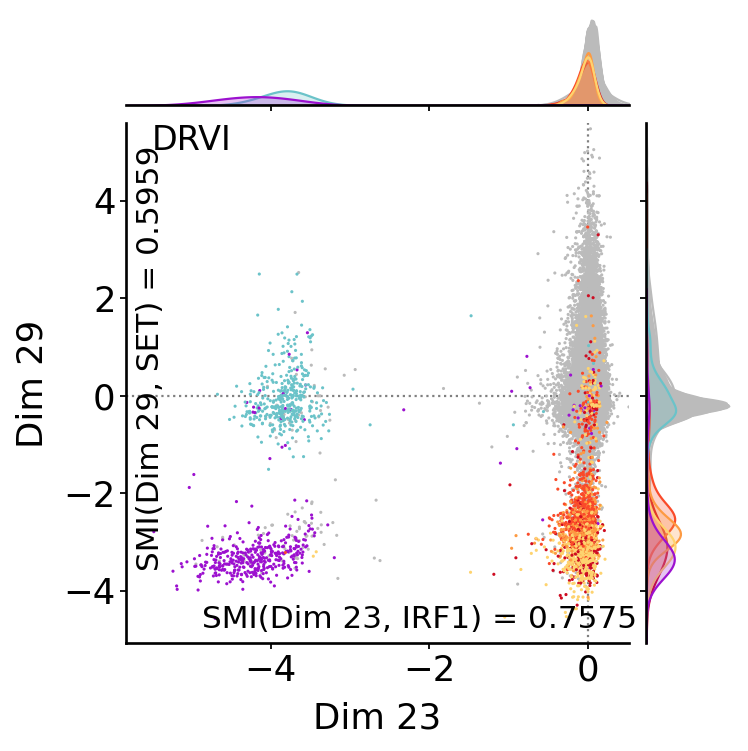

End of latent plots
DRVI-IK
plotting Dim 35, Dim 33


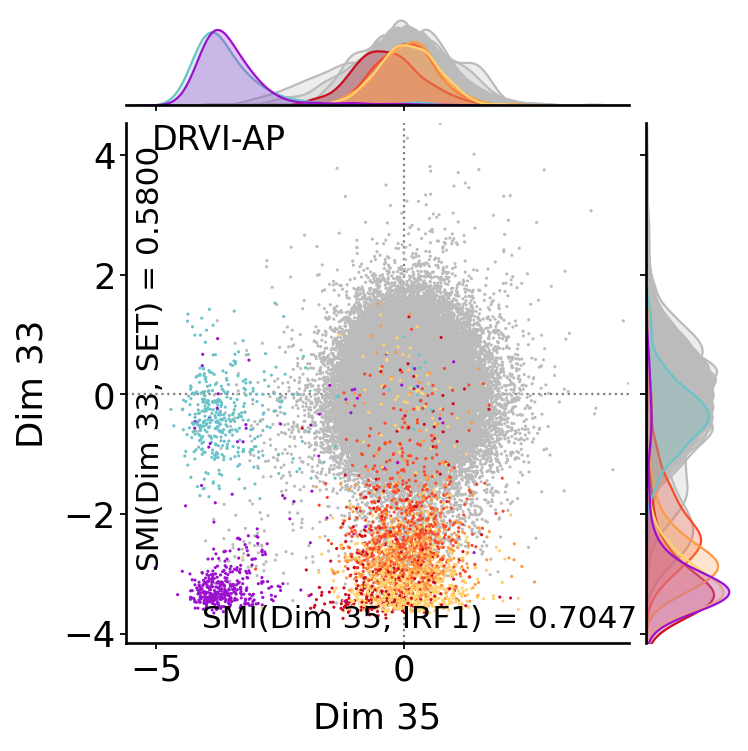

End of latent plots
scVI
plotting Dim 3, Dim 19


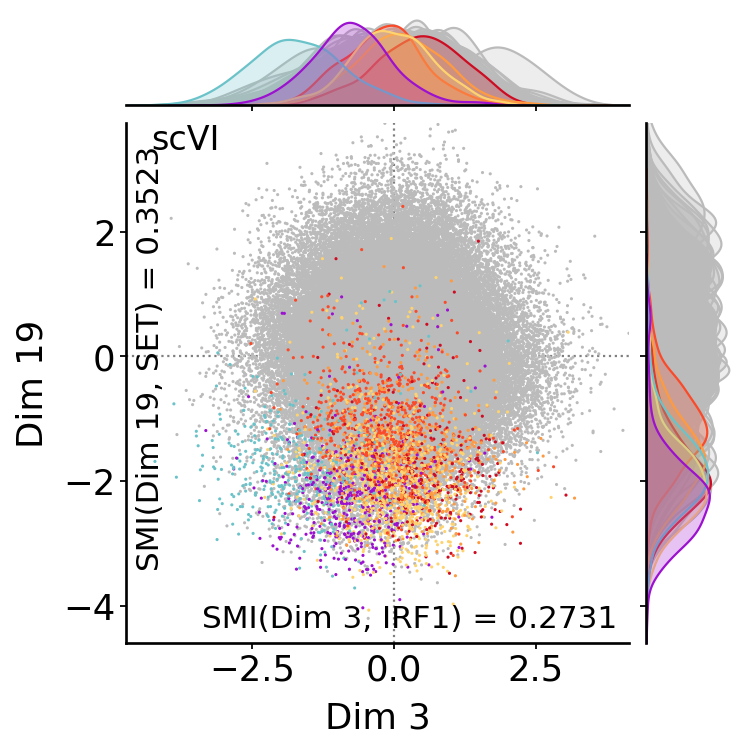

End of latent plots
PCA
plotting Dim 38, Dim 17


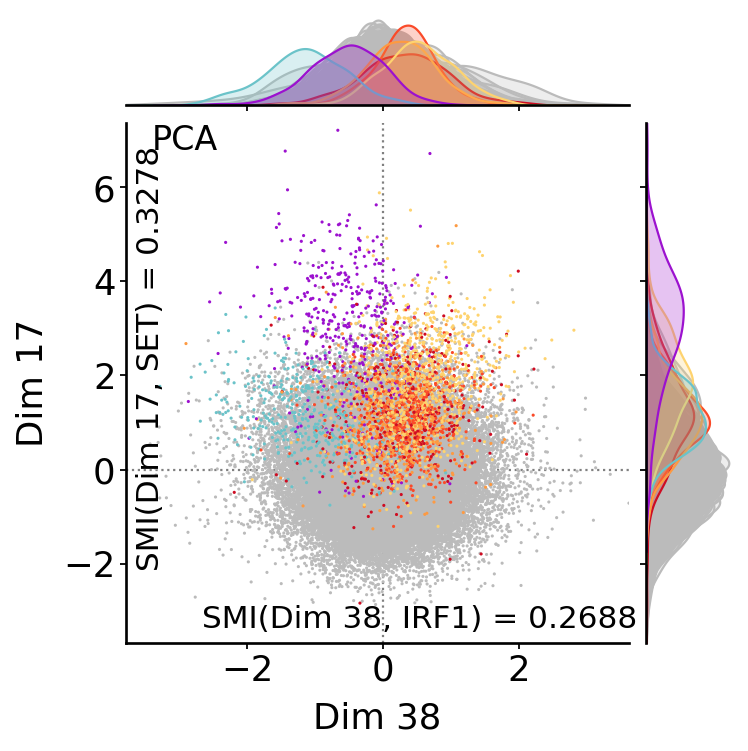

End of latent plots
ICA
plotting Dim 44, Dim 58


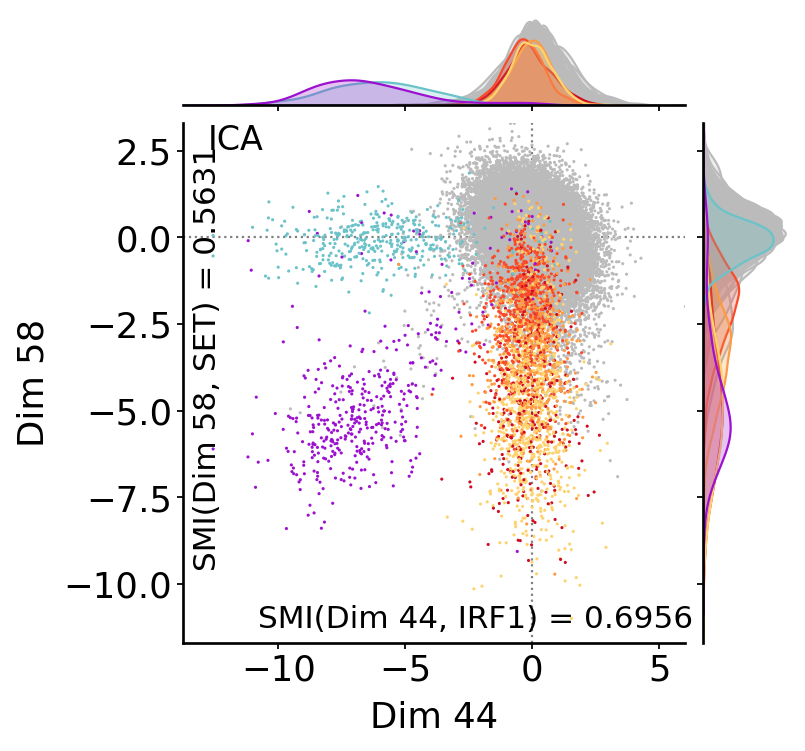

End of latent plots
MOFA
plotting Dim 19, Dim 18


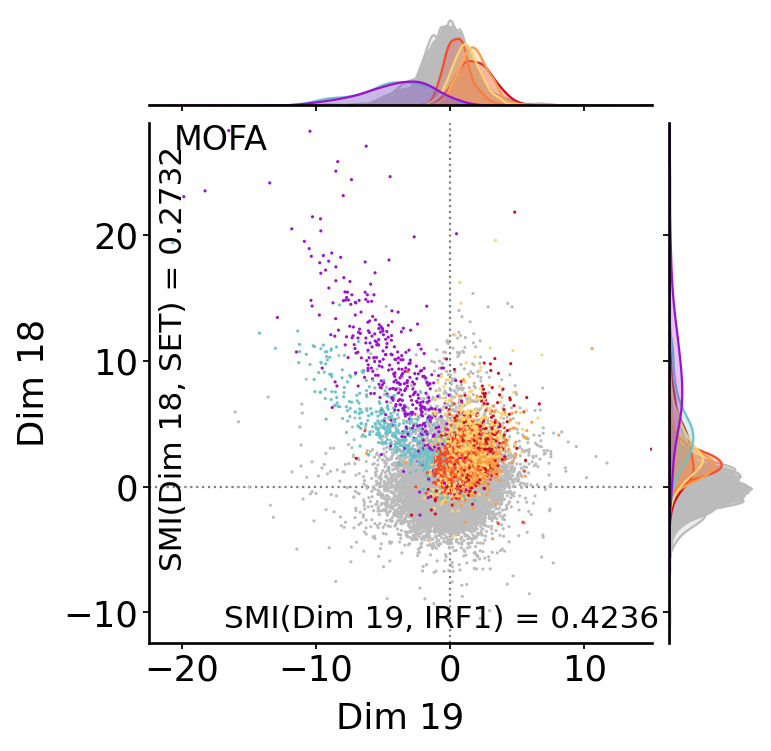

End of latent plots
TCVAE-opt
plotting Dim 61, Dim 41


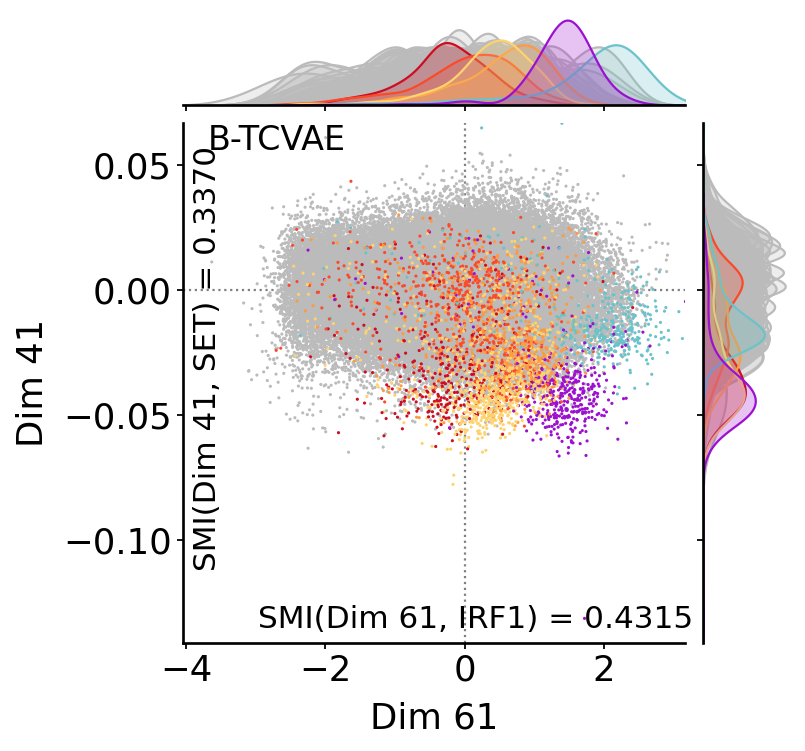

End of latent plots
MICHIGAN-opt
plotting Dim 58, Dim 4


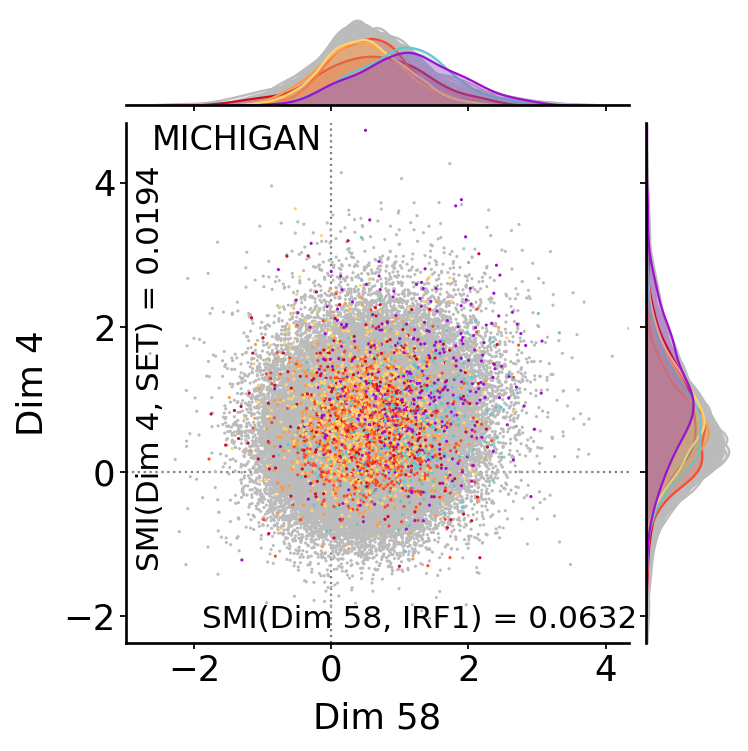

End of latent plots
plotting Dim 58, Dim 4


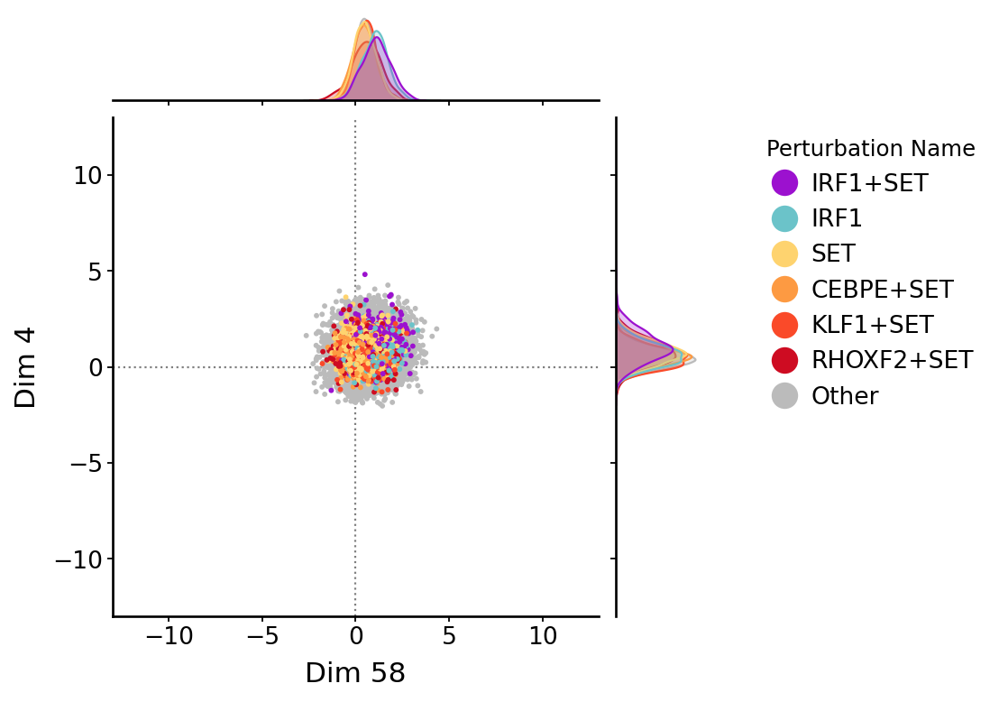

End of latent plots
 p1_cts ['DUSP9', 'DUSP9+MAPK1', 'DUSP9+ETS2', 'DUSP9+PRTG', 'DUSP9+IGDCC3', 'DUSP9+SNAI1', 'DUSP9+KLF1'] 
 p2_cts ['KLF1', 'KLF1+MAP2K6', 'FOXA1+KLF1', 'CEBPE+KLF1', 'COL2A1+KLF1', 'AHR+KLF1', 'KLF1+SET', 'BAK1+KLF1', 'CLDN6+KLF1', 'KLF1+TGFBR2', 'CEBPA+KLF1', 'DUSP9+KLF1']
DRVI
plotting Dim 45, Dim 59


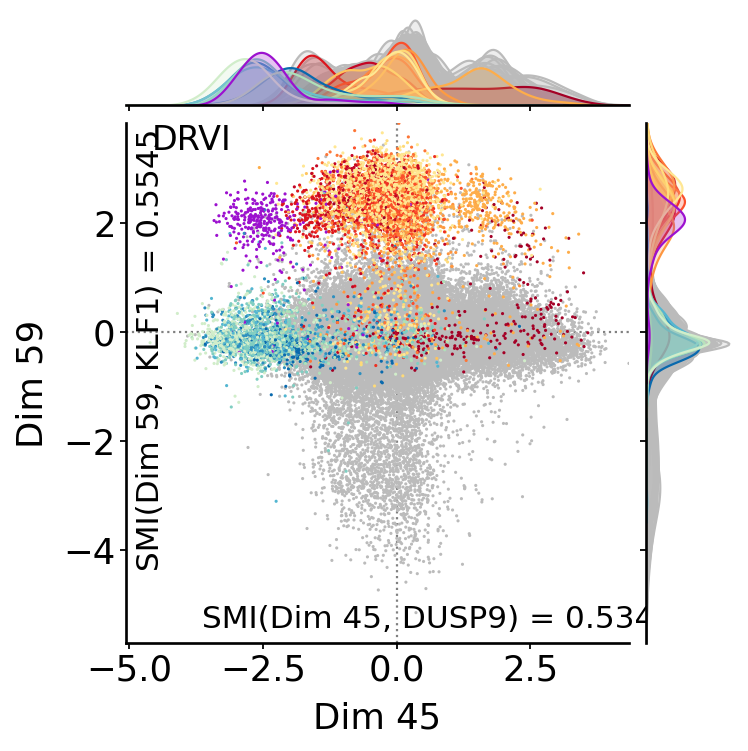

End of latent plots
DRVI-IK
plotting Dim 5, Dim 32


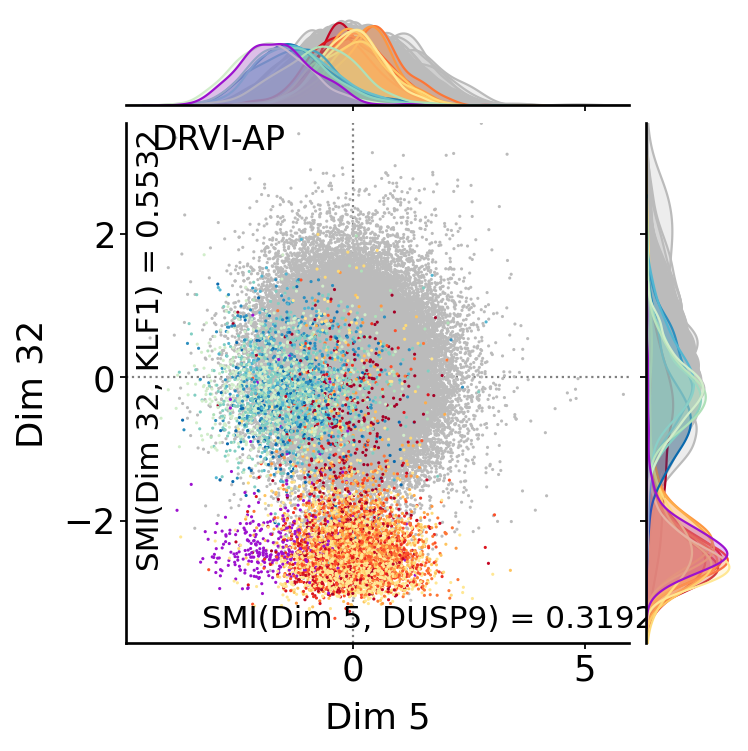

End of latent plots
scVI
plotting Dim 21, Dim 39


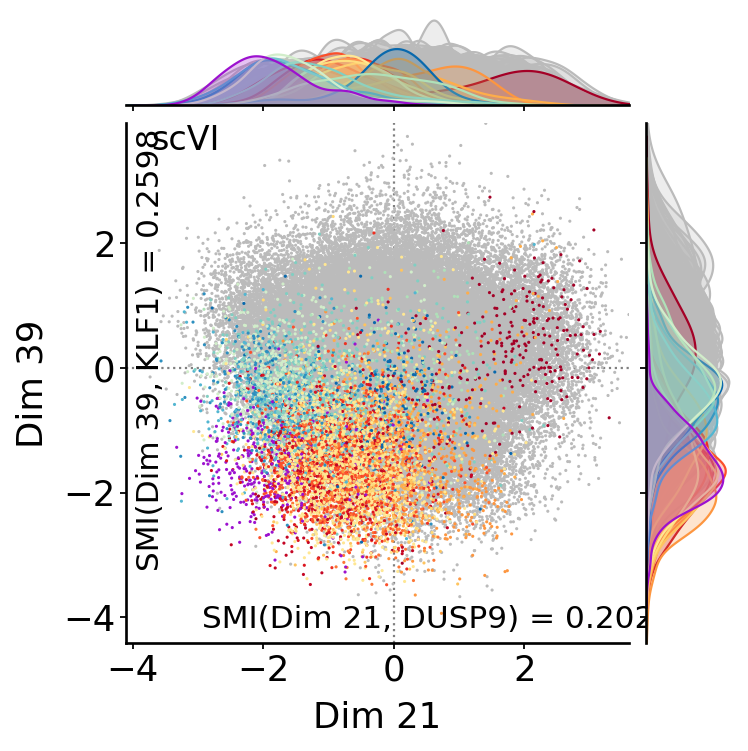

End of latent plots
PCA
plotting Dim 2, Dim 12


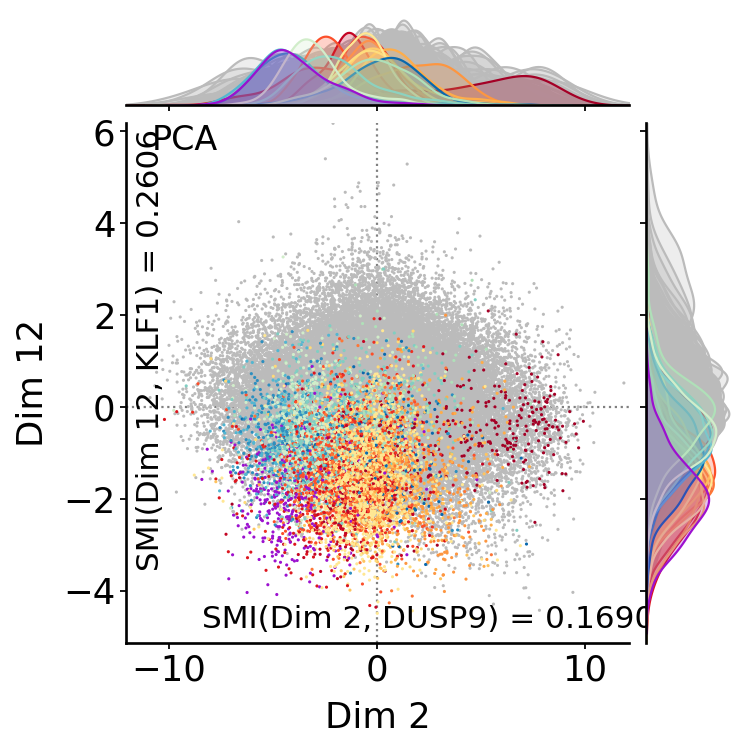

End of latent plots
ICA
plotting Dim 31, Dim 61


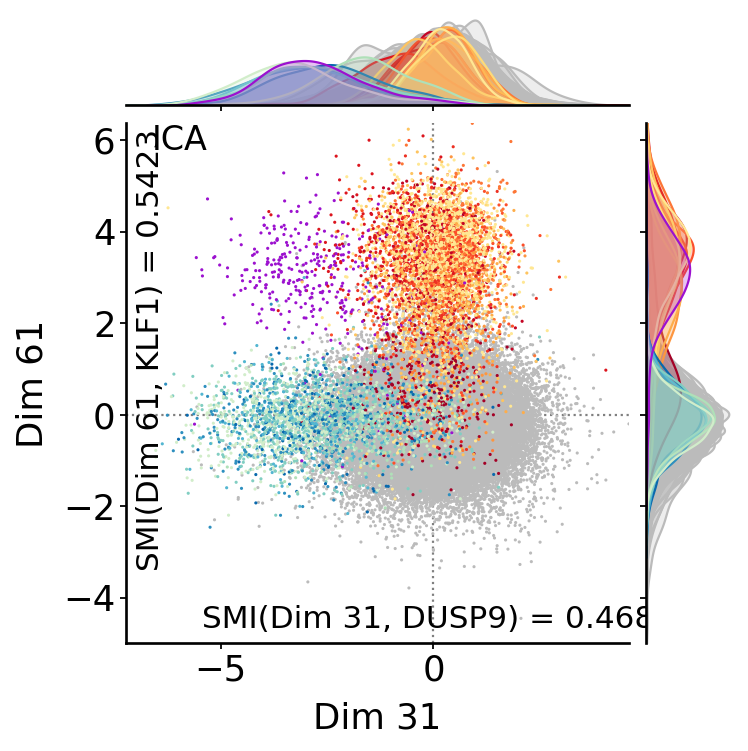

End of latent plots
MOFA
plotting Dim 2, Dim 13


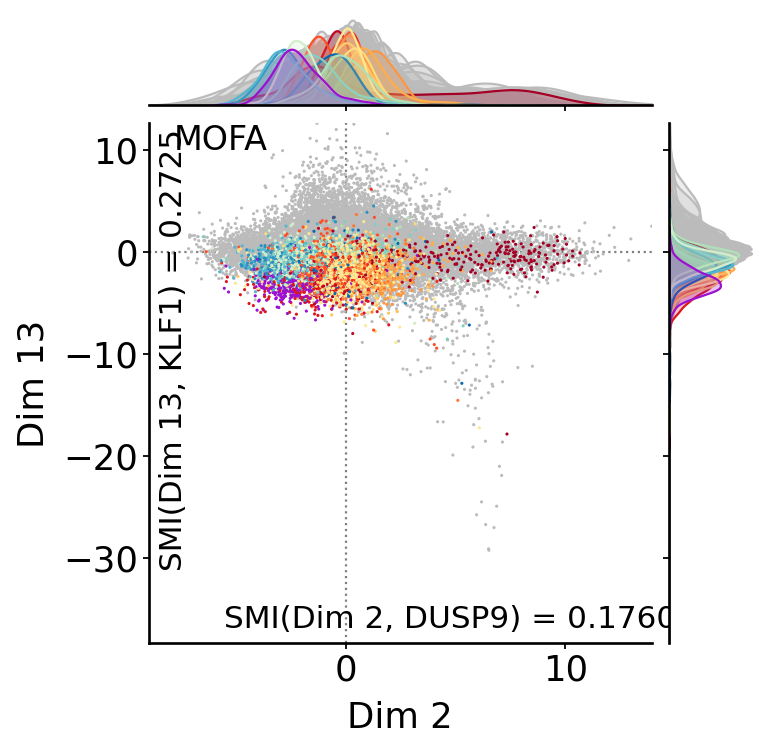

End of latent plots
TCVAE-opt
plotting Dim 46, Dim 31


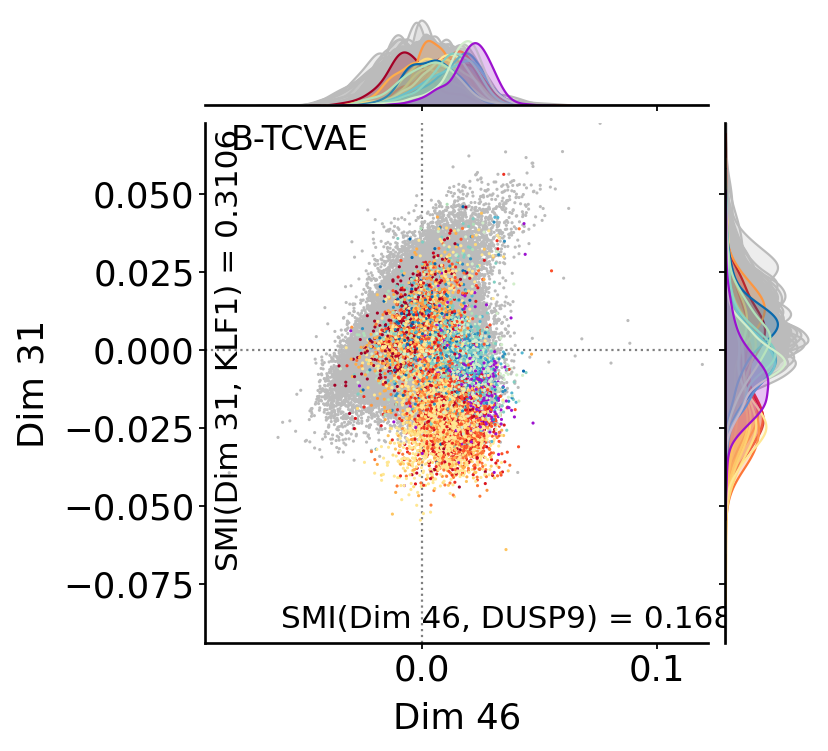

End of latent plots
MICHIGAN-opt
plotting Dim 35, Dim 36


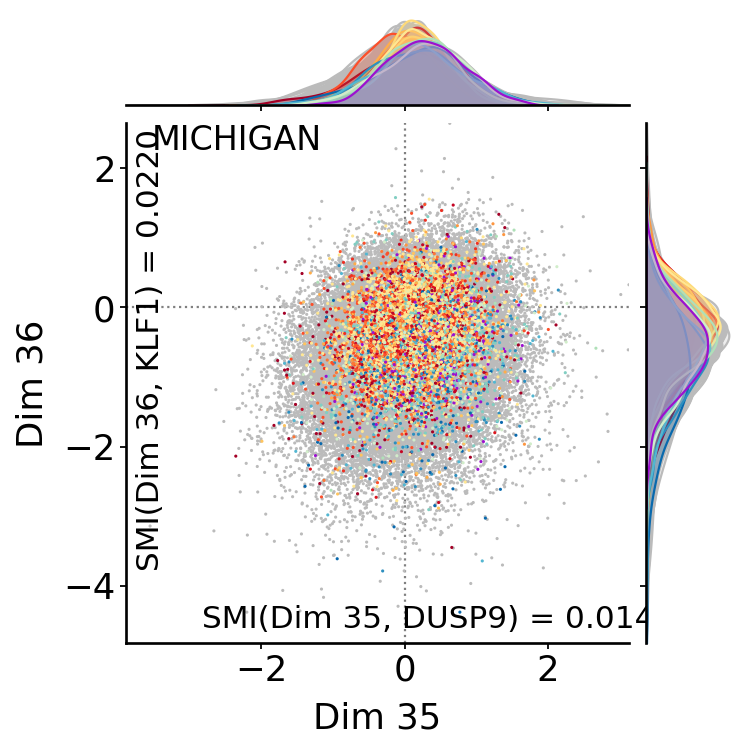

End of latent plots
plotting Dim 35, Dim 36


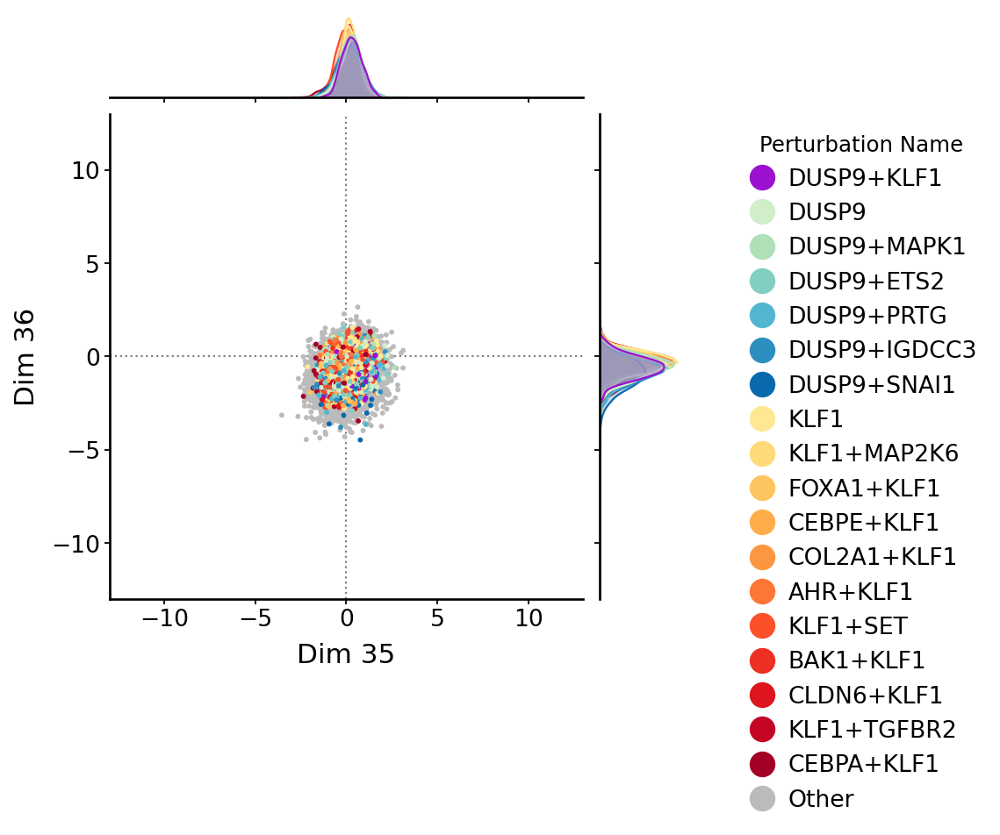

End of latent plots


In [21]:
for (p1, p2) in [
    ('SET', 'KLF1'),
    ('SET', 'DUSP9'),
    ('SET', 'IRF1'),
    ('DUSP9', 'KLF1'),
]:
    if p1 > p2:
        p1, p2 = p2, p1
    p1_cts = list(adata.obs['perturbation_name'][adata.obs['perturbation_name'].str.contains(p1)].unique())
    p1_cts.remove(p1)
    p1_cts.insert(0, p1)
    # the intersection is different
    if f"{p1}+{p2}" in p1_cts:
        p1_cts.remove(f"{p1}+{p2}")
        p1_cts.append(f"{p1}+{p2}")
    
    p2_cts = list(adata.obs['perturbation_name'][adata.obs['perturbation_name'].str.contains(p2)].unique())
    p2_cts.remove(p2)
    p2_cts.insert(0, p2)
    # the intersection is different
    if f"{p1}+{p2}" in p2_cts:
        p2_cts.remove(f"{p1}+{p2}")
        p2_cts.append(f"{p1}+{p2}")
    
    print(" p1_cts", p1_cts, "\n", "p2_cts", p2_cts)

    cmap = matplotlib.cm.ScalarMappable(norm=matplotlib.colors.Normalize(-0.1, 1),
                                        cmap=matplotlib.cm.GnBu)
    cmap_2 = matplotlib.cm.ScalarMappable(norm=matplotlib.colors.Normalize(-0.1, 1),
                                          cmap=matplotlib.cm.YlOrRd)
    
    color_map_p1 = dict(zip(p1_cts, (
        matplotlib.colors.rgb2hex(c) for c in 
        cmap.to_rgba((np.arange(0, len(p1_cts)) + 1) / len(p1_cts))
    )))
    color_map_p2 = dict(zip(p2_cts, (
        matplotlib.colors.rgb2hex(c) for c in 
        cmap_2.to_rgba((np.arange(0, len(p2_cts)) + 1) / len(p2_cts))
    )))
    color_map_all = {
        **{pn: '#bbbbbb' for pn in list(adata.obs['perturbation_name'].unique())},
        **color_map_p1,
        **color_map_p2,
        **({f"{p1}+{p2}": '#9c11cf'} if f"{p1}+{p2}" in p1_cts else {}),
        'Other': '#bbbbbb'
    }
    color_map_all

    for method_name, embed in embeds.items():
        print(method_name)
    
        dim_pair = [int(mi_scores[method_name][p1].argmax()),
                    int(mi_scores[method_name][p2].argmax())]
        if dim_pair[0] == dim_pair[1]:
            print(f"Oh no! two process in one dimension!!!")
            next_max = max(
                mi_scores[method_name][p1][[x for x in range(embed.n_vars) if x != dim_pair[0]]].max(),
                mi_scores[method_name][p2][[x for x in range(embed.n_vars) if x != dim_pair[0]]].max(),
            )
            if next_max in list(mi_scores[method_name][p1]):
                dim_pair[0] = int(np.argwhere(next_max == mi_scores[method_name][p1])[0,0])
            else:
                dim_pair[1] = int(np.argwhere(next_max == mi_scores[method_name][p2])[0,0])
        
        def save_fn(fig, dim_i, dim_j, original_col):
            dir_name = output_dir
            dir_name.mkdir(parents=True, exist_ok=True)
            fig.savefig(dir_name / f'fig2_joint_plot_{method_name}_dims_maximizing_{p1}_{p2}.pdf', bbox_inches='tight', dpi=300)
    
        def pp_fn(g):
            g.ax_joint.legend_.remove()
            g.ax_joint.text(0.05, 0.95, pretify_method_name(method_name), size=15, ha='left', color='black', rotation=0, transform=g.ax_joint.transAxes)
            g.ax_joint.text(0.15, 0.03, f"SMI(Dim {1+dim_pair[0]}, {p1}) = {mi_scores[method_name][p1][dim_pair[0]]:.4f}", size=14, ha='left', color='black', rotation=0, transform=g.ax_joint.transAxes)
            g.ax_joint.text(0.02, 0.15, f"SMI(Dim {1+dim_pair[1]}, {p2}) = {mi_scores[method_name][p2][dim_pair[1]]:.4f}", size=14, ha='left', color='black', rotation=90, transform=g.ax_joint.transAxes)
            x_min, x_max = embed.X[:, dim_pair[0]].min(), embed.X[:, dim_pair[0]].max()
            y_min, y_max = embed.X[:, dim_pair[1]].min(), embed.X[:, dim_pair[1]].max()
            g.ax_marg_x.set_xlim(x_min - (x_max - x_min) * 0.05, x_max)
            g.ax_marg_y.set_ylim(y_min - (y_max - y_min) * 0.05, y_max)
    
        original_params = plt.rcParams.copy()
        set_font_in_rc_params()
        interesting_perts = p1_cts + p2_cts
        # embed.obs['Perturbation Name'] = np.where(
        #     embed.obs['perturbation_name'].isin(interesting_perts),
        #     embed.obs['perturbation_name'],
        #     'Other'
        # )
        embed = embed.copy()
        embed.obs['Perturbation Name'] = embed.obs['perturbation_name']
        embed.obs['top_layer'] = embed.obs['perturbation_name'].isin(p1_cts + p2_cts)
        embed = embed[embed.obs.sort_values('top_layer').index]
        other_perts = [pn for pn in embed.obs['perturbation_name'].unique() if pn not in p1_cts + p2_cts]
        
        plot_per_latent_scatter(embed, ['Perturbation Name'], xy_limit=np.abs(embed.X[:, dim_pair]).max(), 
                                dimensions=[dim_pair], s=2, alpha=1., 
                                predefined_pallete=color_map_all,
                                hue_order=([f"{p1}+{p2}"] if f"{p1}+{p2}" in p1_cts else [])+p1_cts[:-1]+p2_cts[:-1]+other_perts,
                                save_fn=save_fn, 
                                pp_fn=pp_fn, zero_lines=True
                               )
        plt.show()
        plt.rcParams.update(original_params)

    def save_fn(fig, dim_i, dim_j, original_col):
        dir_name = output_dir
        fig.savefig(dir_name / f'fig2_joint_plot_legend_for_dims_maximizing_{p1}_{p2}.pdf', bbox_inches='tight', dpi=300)
    
    embed.obs['Perturbation Name'] = np.where(
        embed.obs['perturbation_name'].isin(interesting_perts),
        embed.obs['perturbation_name'],
        'Other'
    )
    plot_per_latent_scatter(embed, ['Perturbation Name'], xy_limit=13, 
                            dimensions=[dim_pair], s=7, alpha=1., 
                            predefined_pallete=color_map_all,
                            hue_order=([f"{p1}+{p2}"] if f"{p1}+{p2}" in p1_cts else [])+p1_cts[:-1]+p2_cts[:-1]+["Other"],
                            save_fn=save_fn, 
                            zero_lines=True
                           )